<h1>Search Log Analysis of RIS</h1>
<h4>Bachelor Thesis: What do users search for in a legal database?</h4>
<h4>Student: Lorenz Pircher</h4><br>

**Libraries for the import**

In [1]:
import pandas as pd
import os
import numpy as np

**Files of the Working Directory**

**Files in the data folder** (saved as a variable called "all_files" which will be used later in a loop)

In [2]:
all_files = os.listdir('data')

**Merge the CSV files into one big Data Frame**

In [3]:
import warnings
warnings.filterwarnings('ignore')


df = pd.DataFrame()

for file in all_files:
    url = 'data' + '/' + file
    single_df = pd.read_csv(url, header=None, sep='\t', encoding="latin-1")
    df = pd.concat([single_df, df], axis=0).reset_index(drop=True)
    #without reset_index(drop_True) the Index would always start at 0, 
    #when a new file gets in the loop!

**Change Column Names**

In [4]:
df.columns = ['DateTime', 'Application', 'Number_1', 'Number_2', 
              'Variables', 'Other', 'FromTo']

**Shape of the Data Frame: rows, columns**

In [5]:
df.shape

(8643266, 7)

**First 5 rows** <br>
Important check: must contain data from 2019-03-24 ✅

In [6]:
df.head()

,DateTime,Application,Number_1,Number_2,Variables,Other,FromTo
0,"2019-03-24 00:00:17,406",Justiz,5,0.0,+(_Type:[1 TO 1]) +GZForZitat:17os9/13x,(null),-
1,"2019-03-24 00:00:17,422",Justiz,4,0.0,+(_Type:[1 TO 1]) +GZForZitat:17os50/14b,(null),-
2,"2019-03-24 00:00:17,422",Justiz,5,0.0,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,(null),-
3,"2019-03-24 00:00:17,438",Justiz,5,0.0,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,(null),-
4,"2019-03-24 00:00:17,438",Justiz,5,0.0,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,(null),-


**Last 5 rows** <br>
Important check: must contain data from 2019-03-14 ✅

In [7]:
df.tail()

,DateTime,Application,Number_1,Number_2,Variables,Other,FromTo
8643261,"2019-03-14 23:59:42,689",Justiz,4,0.0,+(_Type:[1 TO 1]) +GZForZitat:5ob92/15p,(null),-
8643262,"2019-03-14 23:59:42,705",Justiz,4,0.0,+(_Type:[1 TO 1]) +GZForZitat:1ob11/12t,(null),-
8643263,"2019-03-14 23:59:42,705",Justiz,4,0.0,+(_Type:[1 TO 1]) +GZForZitat:5ob109/09d,(null),-
8643264,"2019-03-14 23:59:42,705",Justiz,4,0.0,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,(null),-
8643265,"2019-03-14 23:59:49,085",Bundesnormen,13,312.0,+(_Type:[1 TO 1]) +(ProcessingResult:[0 TO 0] ...,"<int: ""Dokumenttyp"">,<string: ""Uebergangsrecht...",1 - 2147483647


**Divide DateTime into two separate columns called "Date" and "Time" and delete the column "DateTime"**

In [8]:
df[['Date','Time']] = df.DateTime.str.split(" ",expand=True,)
df = df[['Date','Time','Application', 'Number_1', 'Number_2', 
         'Variables', 'Other', 'FromTo']]
df.head()

,Date,Time,Application,Number_1,Number_2,Variables,Other,FromTo
0,2019-03-24,"00:00:17,406",Justiz,5,0.0,+(_Type:[1 TO 1]) +GZForZitat:17os9/13x,(null),-
1,2019-03-24,"00:00:17,422",Justiz,4,0.0,+(_Type:[1 TO 1]) +GZForZitat:17os50/14b,(null),-
2,2019-03-24,"00:00:17,422",Justiz,5,0.0,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,(null),-
3,2019-03-24,"00:00:17,438",Justiz,5,0.0,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,(null),-
4,2019-03-24,"00:00:17,438",Justiz,5,0.0,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,(null),-


**Divide FromTo into two separate columns called "From" and "To" and delete the column "FromTo"**

In [9]:
df[['From','To']] = df.FromTo.str.split(" - ",expand=True,)
df.drop(['FromTo'], axis=1)
df = df[['Date','Time','Application', 'Number_1', 'Number_2', 
         'Variables', 'Other', 'From', 'To']]
df.tail()

,Date,Time,Application,Number_1,Number_2,Variables,Other,From,To
8643261,2019-03-14,"23:59:42,689",Justiz,4,0.0,+(_Type:[1 TO 1]) +GZForZitat:5ob92/15p,(null),,
8643262,2019-03-14,"23:59:42,705",Justiz,4,0.0,+(_Type:[1 TO 1]) +GZForZitat:1ob11/12t,(null),,
8643263,2019-03-14,"23:59:42,705",Justiz,4,0.0,+(_Type:[1 TO 1]) +GZForZitat:5ob109/09d,(null),,
8643264,2019-03-14,"23:59:42,705",Justiz,4,0.0,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,(null),,
8643265,2019-03-14,"23:59:49,085",Bundesnormen,13,312.0,+(_Type:[1 TO 1]) +(ProcessingResult:[0 TO 0] ...,"<int: ""Dokumenttyp"">,<string: ""Uebergangsrecht...",1,2147483647


**Delete columns Number_1 and Number_2**

In [10]:
df.drop(['Number_1', 'Number_2'], axis=1)
df = df[['Date','Time','Application', 'Variables', 'Other', 'From', 'To']]
df.head()

,Date,Time,Application,Variables,Other,From,To
0,2019-03-24,"00:00:17,406",Justiz,+(_Type:[1 TO 1]) +GZForZitat:17os9/13x,(null),,
1,2019-03-24,"00:00:17,422",Justiz,+(_Type:[1 TO 1]) +GZForZitat:17os50/14b,(null),,
2,2019-03-24,"00:00:17,422",Justiz,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,(null),,
3,2019-03-24,"00:00:17,438",Justiz,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,(null),,
4,2019-03-24,"00:00:17,438",Justiz,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,(null),,


**Replace (null) and empty fields with NaN**

In [11]:
df['From'] = df['From'].replace(r'^\s*$', np.nan, regex=True)
df['To'] = df['To'].replace(r'^\s*$', np.nan, regex=True)
df['Other'] = df['Other'].replace('(null)', np.nan, regex=True)
df.head()

,Date,Time,Application,Variables,Other,From,To
0,2019-03-24,"00:00:17,406",Justiz,+(_Type:[1 TO 1]) +GZForZitat:17os9/13x,NaN,NaN,NaN
1,2019-03-24,"00:00:17,422",Justiz,+(_Type:[1 TO 1]) +GZForZitat:17os50/14b,NaN,NaN,NaN
2,2019-03-24,"00:00:17,422",Justiz,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,NaN,NaN,NaN
3,2019-03-24,"00:00:17,438",Justiz,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,NaN,NaN,NaN
4,2019-03-24,"00:00:17,438",Justiz,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,NaN,NaN,NaN


**Sum up Duplicates**

In [12]:
df.duplicated().sum()

290699

**Show Duplicates**

In [13]:
df.loc[df.duplicated(), :].head()

,Date,Time,Application,Variables,Other,From,To
92,2019-03-24,"00:04:00,378",Justiz,+(_Type:[1 TO 1]) +GZForZitat:4ob16/13a,NaN,NaN,NaN
175,2019-03-24,"00:07:05,409",Vfgh,+(_Type:[1 TO 1]) +GZForZitat:e4241/88,NaN,NaN,NaN
176,2019-03-24,"00:07:05,409",Vfgh,+(_Type:[1 TO 1]) +GZForZitat:e4256/88,NaN,NaN,NaN
177,2019-03-24,"00:07:05,409",Vfgh,+(_Type:[1 TO 1]) +GZForZitat:e5399/88,NaN,NaN,NaN
183,2019-03-24,"00:07:05,425",Vfgh,+(_Type:[1 TO 1]) +GZForZitat:e5399/88,NaN,NaN,NaN


**Delete Duplicates** (Default: keep first row)

In [14]:
df = df.drop_duplicates()
df = df[['Date','Time','Application', 'Variables']]
df.shape

(8352567, 4)

**Edit Time, show only Hours, Minutes and Seconds**

In [15]:
df['Time'] = df['Time'].str.slice(0, -4)
df.head()

,Date,Time,Application,Variables
0,2019-03-24,00:00:17,Justiz,+(_Type:[1 TO 1]) +GZForZitat:17os9/13x
1,2019-03-24,00:00:17,Justiz,+(_Type:[1 TO 1]) +GZForZitat:17os50/14b
2,2019-03-24,00:00:17,Justiz,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...
3,2019-03-24,00:00:17,Justiz,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...
4,2019-03-24,00:00:17,Justiz,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...


**Multiple steps to move the Search Terms in a separate Column**

**Divide column "Variables" in 3 parts: Before "+Suchworte:", Searched and After** see "first_step data frame"

In [16]:
first_step = df["Variables"].str.partition("+Suchworte:", True)
first_step.columns = ['Before', 'Searched', 'After']

In [17]:
first_step.tail(10)

,Before,Searched,After
8643256,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,+Suchworte:,gatternig +(Datum_date:[0 TO 636882047999999999])
8643257,+(_Type:[1 TO 1]) +GZForZitat:5ob109/09d,,
8643258,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,,
8643259,+(_Type:[1 TO 1]) +GZForZitat:5ob37/13x,,
8643260,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,,
8643261,+(_Type:[1 TO 1]) +GZForZitat:5ob92/15p,,
8643262,+(_Type:[1 TO 1]) +GZForZitat:1ob11/12t,,
8643263,+(_Type:[1 TO 1]) +GZForZitat:5ob109/09d,,
8643264,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,,
8643265,+(_Type:[1 TO 1]) +(ProcessingResult:[0 TO 0] ...,,


**Replace specific characters and strings, Import of re** (
thanks to re you do not have to constantly type backslash before brackets)

In [18]:
import re
first_step['After'] = first_step['After'].str.replace(re.escape(
    ' +Suchworte:'), '_')
first_step['After'] = first_step['After'].str.replace(re.escape(
    '+Suchworte:'), '_')
first_step['After'] = first_step['After'].str.replace(re.escape(
    ' +SpanNear'), '&&&')
first_step['After'] = first_step['After'].str.replace(re.escape(', +S'), 
                                                      '&&&')
first_step['After'] = first_step['After'].str.replace(re.escape(
    ' +SpanMultiTermQueryWrapper(Suchworte:'), '_')
first_step['After'] = first_step['After'].str.replace(', Suchworte','_')
first_step['After'] = first_step['After'].str.replace(', suchworte','_')
first_step['After'] = first_step['After'].str.replace('[','_')
first_step['After'] = first_step['After'].str.replace(
    'SpanMultiTermQueryWrapper','_')
first_step['After'] = first_step['After'].str.replace('-SpanNear','_')
first_step['After'] = first_step['After'].str.replace('-Suchworte','_')
first_step['After'] = first_step['After'].str.replace('suchworte:','_')
first_step['After'] = first_step['After'].str.replace('Suchworte:','_')
first_step['After'] = first_step['After'].str.replace(re.escape(')'), 
                                                      '&&&')
first_step['After'] = first_step['After'].str.replace(re.escape('+('), 
                                                      '&&&')
first_step['After'] = first_step['After'].str.replace(re.escape('<'), 
                                                      '&&&')
first_step['After'] = first_step['After'].str.replace(re.escape('+'), 
                                                      '&&&')

In [19]:
first_step.tail(10)

,Before,Searched,After
8643256,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,+Suchworte:,gatternig &&&Datum_date:_0 TO 6368820479999999...
8643257,+(_Type:[1 TO 1]) +GZForZitat:5ob109/09d,,
8643258,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,,
8643259,+(_Type:[1 TO 1]) +GZForZitat:5ob37/13x,,
8643260,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,,
8643261,+(_Type:[1 TO 1]) +GZForZitat:5ob92/15p,,
8643262,+(_Type:[1 TO 1]) +GZForZitat:1ob11/12t,,
8643263,+(_Type:[1 TO 1]) +GZForZitat:5ob109/09d,,
8643264,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,,
8643265,+(_Type:[1 TO 1]) +(ProcessingResult:[0 TO 0] ...,,


**Split first_step and keep only the first part and display not empty rows**

In [20]:
second_step = first_step.After.str.split('&&&').str[0]

In [21]:
second_step = second_step.str.replace(re.escape('_'), ' ')
#to remove leading and ending spaces:
second_step = second_step.str.strip()
not_empty = second_step != ''
preview = second_step[not_empty]
preview.to_frame().drop_duplicates().head(10)

,After
60,"""39534 07"""
317,lebensversicherung rücktritt
370,auslegung urkunde
372,"""bmj s703 034 0014 iv"""
386,59a abs 2 gehg
411,bgbla 2019 ii 70
718,dienstzulage für zweisprachigen unterricht
1456,ugb
1533,tuberkulosegesetz niederösterreich
1683,tuberkulose


**Final Step: Include search terms in the df data frame, replace ' ' with NaN**

In [22]:
second_step = second_step.replace(r'^\s*$', np.nan, regex=True)
df['search_term'] = second_step
df.tail(10)

,Date,Time,Application,Variables,search_term
8643256,2019-03-14,23:59:39,Justiz,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,gatternig
8643257,2019-03-14,23:59:42,Justiz,+(_Type:[1 TO 1]) +GZForZitat:5ob109/09d,NaN
8643258,2019-03-14,23:59:42,Justiz,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,NaN
8643259,2019-03-14,23:59:42,Justiz,+(_Type:[1 TO 1]) +GZForZitat:5ob37/13x,NaN
8643260,2019-03-14,23:59:42,Justiz,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,NaN
8643261,2019-03-14,23:59:42,Justiz,+(_Type:[1 TO 1]) +GZForZitat:5ob92/15p,NaN
8643262,2019-03-14,23:59:42,Justiz,+(_Type:[1 TO 1]) +GZForZitat:1ob11/12t,NaN
8643263,2019-03-14,23:59:42,Justiz,+(_Type:[1 TO 1]) +GZForZitat:5ob109/09d,NaN
8643264,2019-03-14,23:59:42,Justiz,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,NaN
8643265,2019-03-14,23:59:49,Bundesnormen,+(_Type:[1 TO 1]) +(ProcessingResult:[0 TO 0] ...,NaN


**Display columns with a search term**

In [23]:
filter = df['search_term'].isnull() == False
df[filter].head()

,Date,Time,Application,Variables,search_term
60,2019-03-24,00:03:55,Gesamtabfrage,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,"""39534 07"""
317,2019-03-24,00:10:43,Justiz,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,lebensversicherung rücktritt
348,2019-03-24,00:11:47,Justiz,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,lebensversicherung rücktritt
370,2019-03-24,00:13:44,Justiz,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,auslegung urkunde
372,2019-03-24,00:13:49,Erlaesse,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,"""bmj s703 034 0014 iv"""


**New and smaller Data Frames (by Groups and Applications)**

**Unique Applications**

In [24]:
#Delete the rows with the following applications:
df.drop(df[df['Application'] == '(null)'].index, inplace=True)
df.drop(df[df['Application'] == '<string: "Kurztitel_sortable">'].index, 
        inplace=True)
list = df['Application'].unique()

**Manual assignment**

In [25]:
#Federal Law
Bundesnormen = df['Application'] == 'Bundesnormen'
BgblAlt = df['Application'] == 'BgblAlt'
BgblPdf = df['Application'] == 'BgblPdf'
RegV = df['Application'] == 'RegV'
Begut = df['Application'] == 'Begut'
Erv = df['Application'] == 'Erv'
bundesrecht = df[Bundesnormen | BgblAlt | BgblPdf | RegV | Begut | Erv]

#Judikatur
Justiz = df['Application'] == 'Justiz'
Vfgh = df['Application'] == 'Vfgh'
Vwgh = df['Application'] == 'Vwgh'
Gbk = df['Application'] == 'Gbk'
Lvwg = df['Application'] == 'Lvwg'
Dsk = df['Application'] == 'Dsk'
AsylGH = df['Application'] == 'AsylGH'
Uvs = df['Application'] == 'Uvs'
Dok = df['Application'] == 'Dok'
Bvwg = df['Application'] == 'Bvwg'
Normenliste = df['Application'] == 'Normenliste'
Verg = df['Application'] == 'Verg'
Umse = df['Application'] == 'Umse'
Pvak = df['Application'] == 'Pvak'
Bks = df['Application'] == 'Bks'
Ubas = df['Application'] == 'Ubas'
judikatur = df[Justiz | Vfgh | Vwgh | Gbk | Lvwg | Dsk | AsylGH | Uvs | Dok 
               | Bvwg | Normenliste | Verg | Umse | Pvak | Bks | Ubas]

#Gemeinderecht
Gemeinderecht = df['Application'] == 'Gemeinderecht'
gemeinderecht = df[Gemeinderecht]

#Gesamtabfrage
Gesamtabfrage = df['Application'] == 'Gesamtabfrage'
gesamtabfrage = df[Gesamtabfrage]

#Landesrecht
Lgbl = df['Application'] == 'Lgbl'
Landesnormen = df['Application'] == 'Landesnormen'
LgblNO = df['Application'] == 'LgblNO'
LgblAuth = df['Application'] == 'LgblAuth'
landesrecht = df[Lgbl | Landesnormen | LgblNO | LgblAuth]

#Sonstige Kundmachungen Erlässe
Erlaesse = df['Application'] == 'Erlaesse'
Avsv = df['Application'] == 'Avsv'
Spg = df['Application'] == 'Spg'
Avn = df['Application'] == 'Avn'
PruefGewO = df['Application'] == 'PruefGewO'
sonstige = df[Erlaesse | Avsv | Spg | Avn | PruefGewO]

**Federal Law Data Frame**

In [26]:
bundesrecht.head()

,Date,Time,Application,Variables,search_term
27,2019-03-24,00:00:47,Bundesnormen,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,NaN
47,2019-03-24,00:01:34,Bundesnormen,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,NaN
49,2019-03-24,00:02:01,Bundesnormen,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,NaN
54,2019-03-24,00:03:32,Bundesnormen,+(_Type:[1 TO 1]) +(ProcessingResult:[0 TO 0] ...,NaN
115,2019-03-24,00:04:09,Bundesnormen,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,NaN


In [27]:
bundesrecht.shape

(1314945, 5)

**State Law Data Frame**

In [28]:
landesrecht.head()

,Date,Time,Application,Variables,search_term
44,2019-03-24,00:00:57,Lgbl,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,NaN
45,2019-03-24,00:01:02,Lgbl,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,NaN
188,2019-03-24,00:07:20,Landesnormen,+(_Type:[1 TO 1]) +(ProcessingResult:[0 TO 0] ...,NaN
221,2019-03-24,00:08:51,Lgbl,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,NaN
246,2019-03-24,00:09:27,LgblNO,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,NaN


In [29]:
landesrecht.shape

(302113, 5)

**Judicature Data Frame**

In [30]:
judikatur.head()

,Date,Time,Application,Variables,search_term
0,2019-03-24,00:00:17,Justiz,+(_Type:[1 TO 1]) +GZForZitat:17os9/13x,NaN
1,2019-03-24,00:00:17,Justiz,+(_Type:[1 TO 1]) +GZForZitat:17os50/14b,NaN
2,2019-03-24,00:00:17,Justiz,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,NaN
3,2019-03-24,00:00:17,Justiz,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,NaN
4,2019-03-24,00:00:17,Justiz,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,NaN


In [31]:
judikatur.shape

(6052239, 5)

**Municipal Law Data Frame**

In [32]:
gemeinderecht.head()

,Date,Time,Application,Variables,search_term
3093,2019-03-24,01:13:35,Gemeinderecht,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,wiener
8178,2019-03-24,01:57:22,Gemeinderecht,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,NaN
8254,2019-03-24,01:57:58,Gemeinderecht,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,NaN
8257,2019-03-24,01:58:04,Gemeinderecht,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,NaN
10478,2019-03-24,02:13:35,Gemeinderecht,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,NaN


In [33]:
gemeinderecht.shape

(3353, 5)

**Other Data Frame**

In [34]:
sonstige.head()

,Date,Time,Application,Variables,search_term
372,2019-03-24,00:13:49,Erlaesse,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,"""bmj s703 034 0014 iv"""
1158,2019-03-24,00:39:06,Erlaesse,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,"""bmj s703 034 0014 iv"""
7274,2019-03-24,01:47:52,Avsv,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,NaN
25568,2019-03-24,06:10:51,Erlaesse,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,NaN
30541,2019-03-24,08:32:04,Erlaesse,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,NaN


In [35]:
sonstige.shape

(1691, 5)

**Total Query Data Frame**

In [36]:
gesamtabfrage.head()

,Date,Time,Application,Variables,search_term
50,2019-03-24,00:03:29,Gesamtabfrage,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,NaN
51,2019-03-24,00:03:29,Gesamtabfrage,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,NaN
52,2019-03-24,00:03:29,Gesamtabfrage,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,NaN
53,2019-03-24,00:03:29,Gesamtabfrage,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,NaN
55,2019-03-24,00:03:48,Gesamtabfrage,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,NaN


**Old Data Frame with new column "Group"**

In [37]:
conditions = [(df['Application'] == 'Bundesnormen') | 
              (df['Application'] == 'BgblAlt') | (df[
                  'Application'] == 'BgblPdf')
              | (df['Application'] == 'RegV') | (df[
                  'Application'] == 'Begut') | 
              (df['Application'] == 'Erv'), (df['Application'] == 'Lgbl') | 
              (df['Application'] == 'Landesnormen') | 
              (df['Application'] == 'LgblNO') |(df[
                  'Application'] == 'LgblAuth'), 
              (df['Application'] == 'Gemeinderecht'), (df[
                  'Application'] == 'Justiz') | 
              (df['Application'] == 'Vfgh') | (df[
                  'Application'] == 'Vwgh') | 
              (df['Application'] == 'Gbk') | (df[
                  'Application'] == 'Lvwg') | 
              (df['Application'] == 'Dsk') | (df['Application'] == 'AsylGH') | 
              (df['Application'] == 'Uvs') | (df['Application'] == 'Dok') | 
              (df['Application'] == 'Bvwg') | (df[
                  'Application'] == 'Normenliste') | 
              (df['Application'] == 'Verg') | (df['Application'] == 'Umse') | 
              (df['Application'] == 'Pvak') | (df['Application'] == 'Bks') | 
              (df['Application'] == 'Ubas'), (df[
                  'Application'] == 'Erlaesse') | 
              (df['Application'] == 'Avsv') | (df['Application'] == 'Spg') | 
              (df['Application'] == 'Avn') | (df[
                  'Application'] == 'PruefGewO'), 
              (df['Application'] == 'Gesamtabfrage')]

choices = ['Bundesrecht', 'Landesrecht', 'Gemeinderecht', 'Judikatur', 
           'Sonstige EuK', 'Gesamtabfrage']
df['Groups'] = np.select(conditions, choices, default='NoGroup')
df.tail(10)

,Date,Time,Application,Variables,search_term,Groups
8643256,2019-03-14,23:59:39,Justiz,+(ProcessingResult:[0 TO 0] ProcessingResult:[...,gatternig,Judikatur
8643257,2019-03-14,23:59:42,Justiz,+(_Type:[1 TO 1]) +GZForZitat:5ob109/09d,NaN,Judikatur
8643258,2019-03-14,23:59:42,Justiz,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,NaN,Judikatur
8643259,2019-03-14,23:59:42,Justiz,+(_Type:[1 TO 1]) +GZForZitat:5ob37/13x,NaN,Judikatur
8643260,2019-03-14,23:59:42,Justiz,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,NaN,Judikatur
8643261,2019-03-14,23:59:42,Justiz,+(_Type:[1 TO 1]) +GZForZitat:5ob92/15p,NaN,Judikatur
8643262,2019-03-14,23:59:42,Justiz,+(_Type:[1 TO 1]) +GZForZitat:1ob11/12t,NaN,Judikatur
8643263,2019-03-14,23:59:42,Justiz,+(_Type:[1 TO 1]) +GZForZitat:5ob109/09d,NaN,Judikatur
8643264,2019-03-14,23:59:42,Justiz,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,NaN,Judikatur
8643265,2019-03-14,23:59:49,Bundesnormen,+(_Type:[1 TO 1]) +(ProcessingResult:[0 TO 0] ...,NaN,Bundesrecht


In [38]:
df.drop(df[df['Groups'] == 'NoGroup'].index, inplace=True)

**New Rows per Day**

In [39]:
import matplotlib.pyplot as plt
df['Date'] = pd.to_datetime(df['Date'])
df.groupby(df['Date'].dt.date).size().plot()
fig = plt.gcf()
fig.set_size_inches(16.5, 8.5)
plt.ylabel('Search Logs')
plt.grid()
fig.savefig('row_per_day.png', dpi=100)

In [40]:
#Numeric
df.groupby(df['Date'].dt.date).size()

Date
2019-03-14     380219
2019-03-15     828753
2019-03-16     461364
2019-03-17     460464
2019-03-18    1040584
2019-03-19    1090515
2019-03-20    1079082
2019-03-21    1226047
2019-03-22     915322
2019-03-23     438156
2019-03-24     420438
dtype: int64

**Cumulative amount of Search Logs**

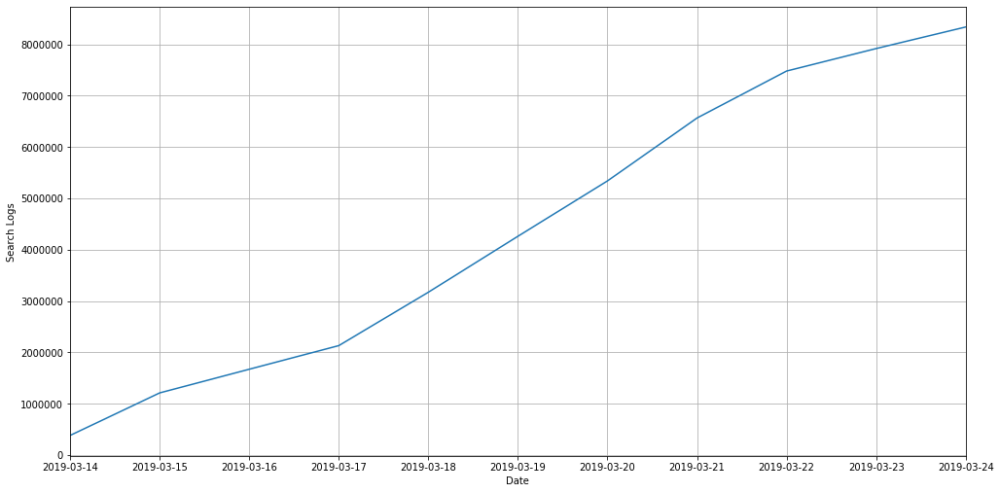

In [41]:
df.groupby(df['Date'].dt.date).size().cumsum().plot()
fig = plt.gcf()
fig.set_size_inches(16.5, 8.5)
plt.ylabel('Search Logs')
plt.grid()
fig.savefig('cumulative_logs.png', dpi=100)

**Distribution Groups**

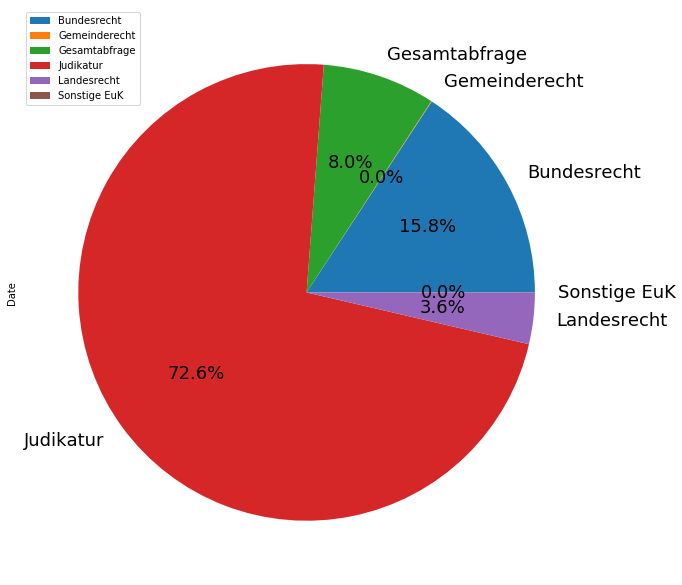

In [42]:
df.groupby(df['Groups']).count().plot.pie(y='Date', autopct='%1.1f%%', 
                                          fontsize=18)
fig = plt.gcf()
fig.set_size_inches(18.5, 10.5)
fig.savefig('pie_groups.png', dpi=100)

**Distribution Search Terms**

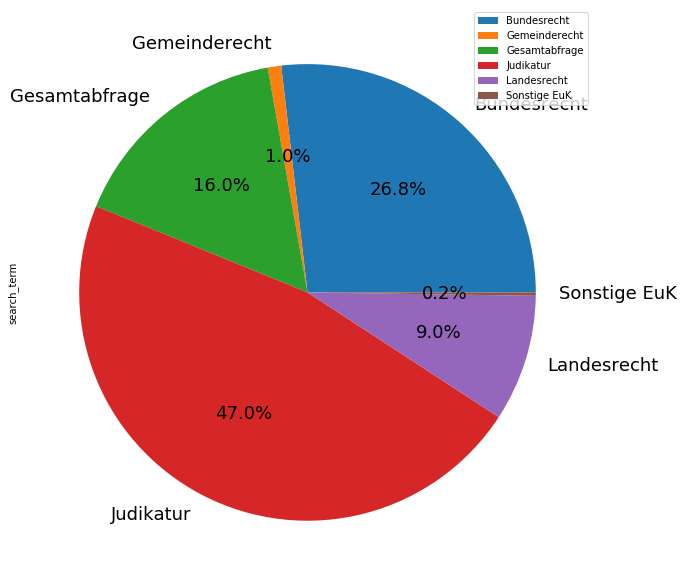

In [43]:
df.groupby(df['Groups']).count().plot.pie(y='search_term', autopct='%1.1f%%', 
                                          fontsize=18)
fig = plt.gcf()
fig.set_size_inches(18.5, 10.5)
fig.savefig('pie_search_terms.png', dpi=100)

**Sankey Chart**

**Groupby Groups and Groupby Groups, Application and export into a Excel File**

In [44]:
summe = df.Date.count() #sum search logs
erstesp = df.groupby(df['Groups']).size() #amount search logs groupby groups
zweitesp = df.groupby(['Groups','Application']).size()
#amount search logs groupby groups, application
zweitesp.to_excel("output.xlsx")
#edited in excel

**Create the Sankey Chart** (can downloaded and edited in real time )

In [45]:
#pip install plotly
#created with the help of Excel, values were copied in from output.xlsx!

import plotly.graph_objects as go

fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = ["Search Logs", "Federal Law", "Municipal Law", "Total Query", 
               "Judicature", "State Law", "Other", "Begut", "BgblAlt", 
               "BgblPdf", "Bundesnormen", "Erv", "RegV", "Gemeinderecht", 
               "Gesamtabfrage", "AsylGH", "Bks", "Bvwg", "Dok", "Dsk", 
               "Gbk", "Justiz", "Lvwg", "Normenliste", "Pvak", "Ubas", 
               "Umse", "Uvs", "Verg", "Vfgh", "Vwgh", "Landesnormen", 
               "Lgbl", "LgblAuth", "LgblNO", "Avn", "Avsv", "Erlaesse", 
               "PruefGewO", "Spg"],
      color = "blue"),
    link = dict(
      source = [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 2, 3, 4, 4, 4, 4, 
                4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 6, 6, 6, 
                6, 6], # indices correspond to labels, eg A1, A2, A2, B1, ...
      target = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16,
                17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31,
                32, 33, 34, 35, 36, 37, 38, 39],
      value = [1314945,3353,666603,6052239,302113,1691,4054,13381,4858,
               1288412,708,3532,3353,666603,275,17,15535,508,2714,93,4514781,
               7147,421,125,19,46,2031,343,1426041,82143,273688,12898,13815,
               1712,45,740,809,29,68]
  ))])

fig.update_layout(title_text="RIS Search Log Sankey Diagram", font_size=8)
fig.show()

**Text Segmentation** (incl. removing the search operators)

In [46]:
filter = df['search_term'].isnull() == False
s_df = df[filter]

new = second_step[not_empty].to_frame()
#remove search operators
new['After'] = new['After'].str.replace('"','')
new["After"] = new["After"].str.replace("'","")
new['After'] = new['After'].str.replace('*','')
new['After'] = new['After'].str.replace('(','')
new['After'] = new['After'].str.replace('oder','')
new['After'] = new['After'].str.replace('Oder','')
new['After'] = new['After'].str.replace('ODER','')
new['After'] = new['After'].str.replace('nicht','')
new['After'] = new['After'].str.replace('Nicht','')
new['After'] = new['After'].str.replace('NICHT','')
new['After'] = new['After'].str.replace('  ',' ')
new['After'] = new.After.str.strip().str.split('[\W_]+') 
#tokenize the sentences into words aka terms
new['After'] = new['After'].astype(str)
new
new['After'] = new['After'].str.replace('[','')
new['After'] = new['After'].str.replace(']','')
new['After'] = new['After'].str.replace("'","")
new['After'] = new['After'].str.replace(', Suchworte','')
new['After'] = new['After'].str.replace(', suchworte','')
new['After'] = new['After'].str.lstrip(', ')

In [47]:
new.head()

,After
60,"39534, 07"
317,"lebensversicherung, rücktritt"
348,"lebensversicherung, rücktritt"
370,"auslegung, urkunde"
372,"bmj, s703, 034, 0014, iv"


In [48]:
new['Groups'] = s_df['Groups']

#Filter
judicature_f = new['Groups'] == "Judikatur"
federal_f = new['Groups'] == "Bundesrecht"
state_f = new['Groups'] == "Landesrecht"
municipal_f = new['Groups'] == "Gemeinderecht"
other_f = new['Groups'] == "Sonstige EuK"
total_f = new['Groups'] == "Gesamtabfrage"

#new Data Frames for the groups
jud_df = new[judicature_f]
federal_df = new[federal_f]
state_df = new[state_f]
municipal_df = new[municipal_f]
other_df = new[other_f]
total_df = new[total_f]

#create lists
jud_list = jud_df["After"].tolist()
federal_list = federal_df["After"].tolist()
state_list = state_df["After"].tolist()
municipal_list = municipal_df["After"].tolist()
other_list = other_df["After"].tolist()
total_list = total_df["After"].tolist()

**Stemming and lemmatization**

In [49]:
from nltk.stem.snowball import SnowballStemmer
stemmer = SnowballStemmer("german")

j_list = []
for w in jud_list:
    word = stemmer.stem(w)
    j_list.append(word)

**Define the stop-words**

In [50]:
#pip install stop-words
from stop_words import get_stop_words
stopword = get_stop_words('german')
stopword.extend(['dtype', 'size', 'search_term', 'Name', 'After', 'Length', 
                 'object'])

**Judicature WordCloud without lemmatization**

<Figure size 432x288 with 0 Axes>

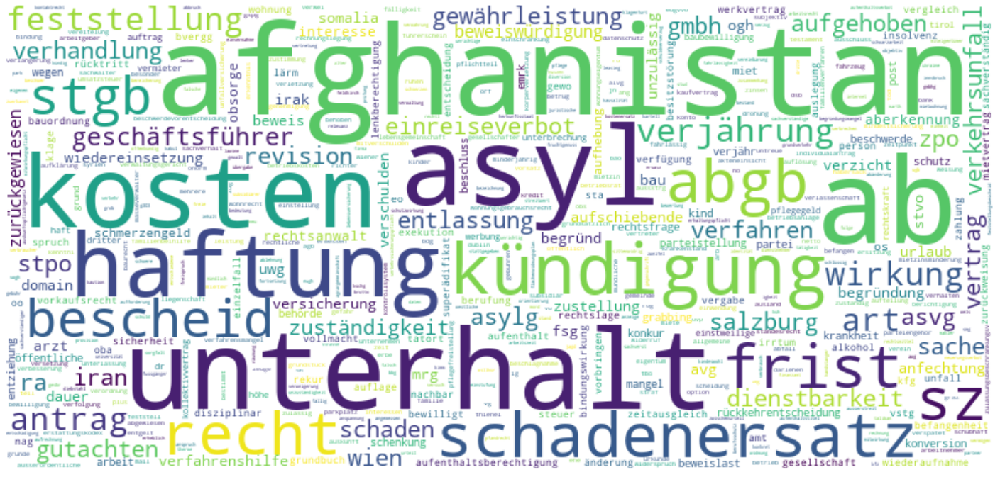

<Figure size 432x288 with 0 Axes>

In [51]:
from os import path
from PIL import Image
import numpy as np
import os

from wordcloud import WordCloud, STOPWORDS

with open('jud_list.txt', 'w') as filehandle:
    filehandle.writelines("%s\n" % j for j in jud_list)
text = open('jud_list.txt').read()
maske = np.array(Image.open("mask.png"))

stopwords = set(STOPWORDS)

wc = WordCloud(background_color="white", max_words=2000, mask=maske,
               stopwords=stopword, contour_width=3, contour_color='steelblue', 
               max_font_size=100, random_state=42, width=1000, height=860, 
               margin=2, collocations=False)



# generate word cloud
wc.generate(text)

# store to file
wc.to_file("wc_without_judicature.png")

# show
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
fig = plt.gcf()
fig.set_size_inches(25, 15)
plt.figure()

**Judicature WordCloud with lemmatization**

<Figure size 432x288 with 0 Axes>

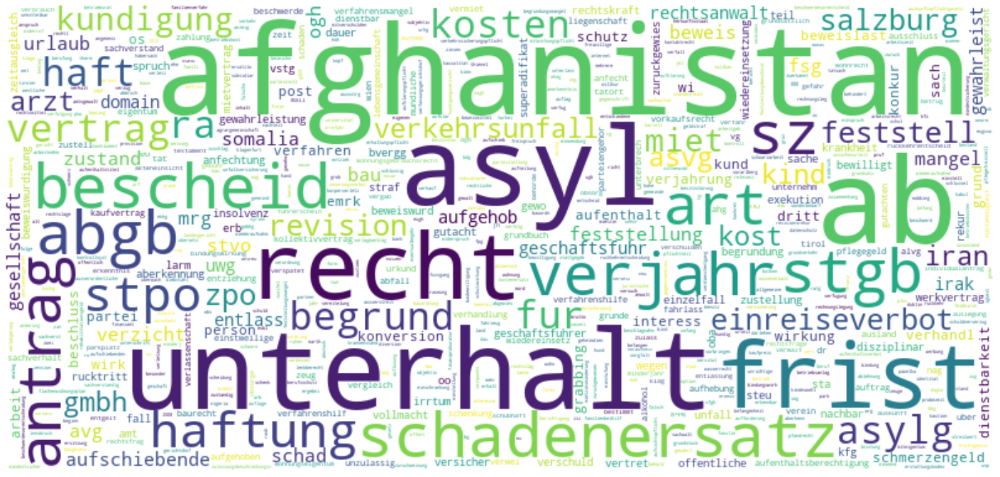

<Figure size 432x288 with 0 Axes>

In [52]:
with open('j_list.txt', 'w') as filehandle:
    filehandle.writelines("%s\n" % j for j in j_list)
text = open('j_list.txt').read()
maske = np.array(Image.open("mask.png"))

stopwords = set(STOPWORDS)

wc = WordCloud(background_color="white", max_words=2000, mask=maske,
               stopwords=stopword, contour_width=3, contour_color='steelblue', 
               max_font_size=100, random_state=42, width=1000, height=860, 
               margin=2, collocations=False)



# generate word cloud
wc.generate(text)

# store to file
wc.to_file("wc_with_judicature.png")

# show
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
fig = plt.gcf()
fig.set_size_inches(25, 15)
plt.figure()

**Federal Law WordCloud**

<Figure size 432x288 with 0 Axes>

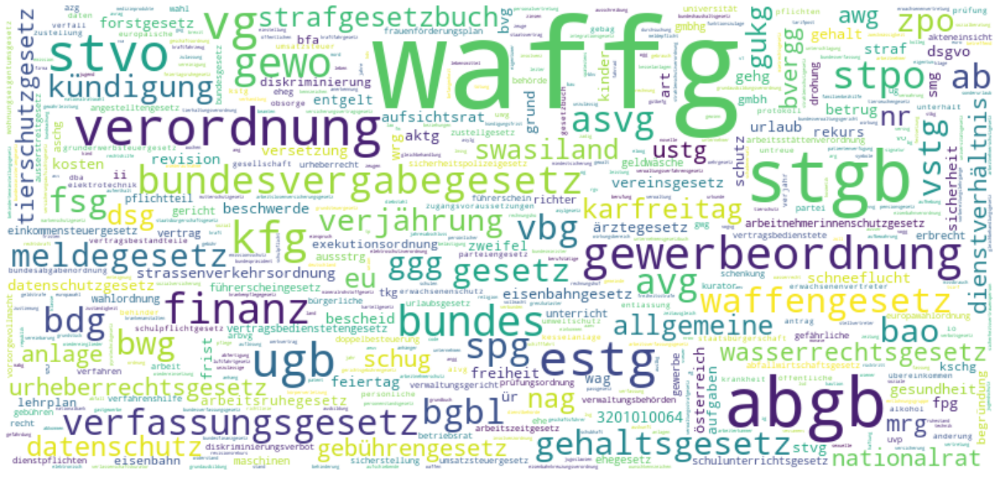

<Figure size 432x288 with 0 Axes>

In [53]:
with open('federal_list.txt', 'w') as filehandle:
    filehandle.writelines("%s\n" % f for f in federal_list)
text = open('federal_list.txt').read()
maske = np.array(Image.open("mask.png"))

stopwords = set(STOPWORDS)

wc = WordCloud(background_color="white", max_words=2000, mask=maske,
               stopwords=stopword, contour_width=3, contour_color='steelblue', 
               max_font_size=100, random_state=42, width=1000, height=860, 
               margin=2, collocations=False)



# generate word cloud
wc.generate(text)

# store to file
wc.to_file("wc_federal.png")

# show
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
fig = plt.gcf()
fig.set_size_inches(25, 15)
plt.figure()

**State Law WordCloud**

<Figure size 432x288 with 0 Axes>

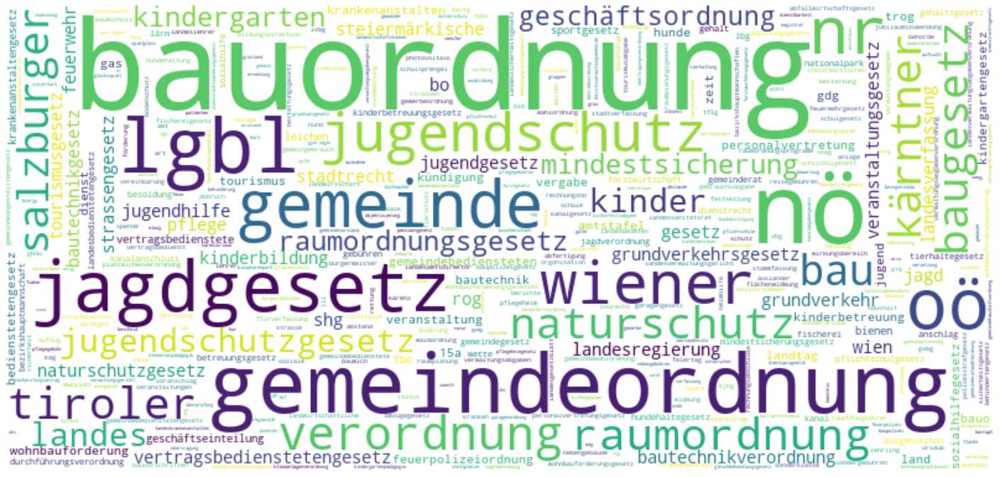

<Figure size 432x288 with 0 Axes>

In [54]:
with open('state_list.txt', 'w') as filehandle:
    filehandle.writelines("%s\n" % s for s in state_list)
text = open('state_list.txt').read()
maske = np.array(Image.open("mask.png"))

stopwords = set(STOPWORDS)

wc = WordCloud(background_color="white", max_words=2000, mask=maske,
               stopwords=stopword, contour_width=3, contour_color='steelblue', 
               max_font_size=100, random_state=42, width=1000, height=860, 
               margin=2, collocations=False)



# generate word cloud
wc.generate(text)

# store to file
wc.to_file("wc_state.png")

# show
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
fig = plt.gcf()
fig.set_size_inches(25, 15)
plt.figure()

**Total Query WordCloud**

<Figure size 432x288 with 0 Axes>

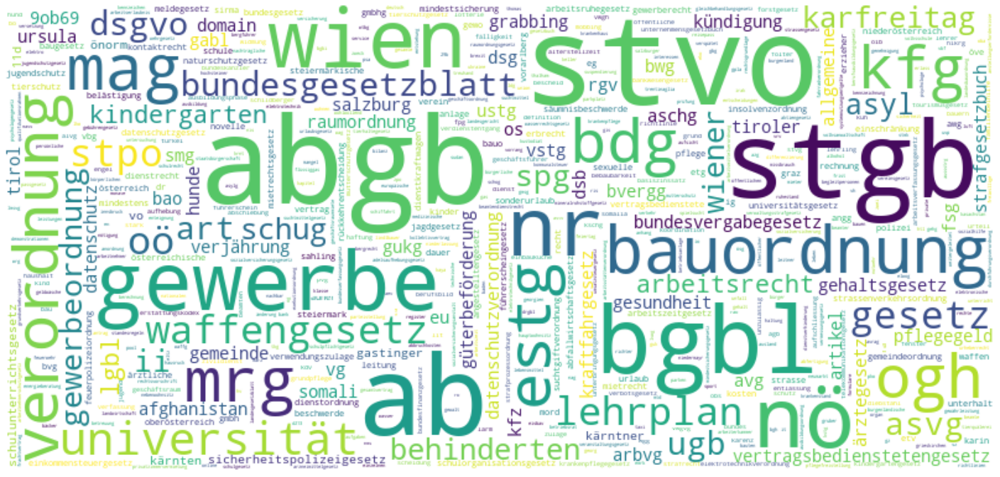

<Figure size 432x288 with 0 Axes>

In [55]:
with open('total_list.txt', 'w') as filehandle:
    filehandle.writelines("%s\n" % t for t in total_list)
text = open('total_list.txt').read()
maske = np.array(Image.open("mask.png"))

stopwords = set(STOPWORDS)

wc = WordCloud(background_color="white", max_words=2000, mask=maske,
               stopwords=stopword, contour_width=3, 
               contour_color='steelblue', max_font_size=100, random_state=42, 
               width=1000, height=860, margin=2, collocations=False)



# generate word cloud
wc.generate(text)

# store to file
wc.to_file("wc_total.png")

# show
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
fig =plt.gcf()
fig.set_size_inches(25, 15)
plt.figure()

**Statistics**

**Word Counter as a bar chart**

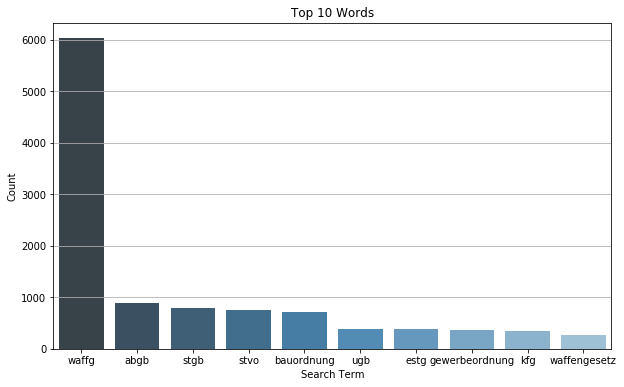

In [56]:
import seaborn as sns

term_df = new.After.value_counts().to_frame()
term_df
term_df['Search Term'] = new.After.value_counts().index
term_df.columns = ["Count", "Search Term"]
popular = term_df.head(10)
plt.rcParams.update({'font.size': 10})
plt.figure(figsize=(10,6))
plt.grid()
sns.barplot("Search Term", "Count", data=popular, 
            palette="Blues_d").set_title("Top 10 Words")
plt.savefig("top10.png")

**Amount of unique search terms**

In [57]:
new.After.nunique()

68570

**Average Search Term length** (measured in characters)

In [58]:
words = new['After'].tolist()
average = sum(len(word) for word in words) / len(words)
average

16.77017790328608

**Search Term words**

In [59]:
new['totalwords'] = new['After'].str.count(' ') + 1 
#there are only spaces after commas
#the amount of spaces + 1 gives the amount of words per column
new.totalwords.describe()

count    211407.000000
mean          1.749644
std           1.292600
min           1.000000
25%           1.000000
50%           1.000000
75%           2.000000
max          68.000000
Name: totalwords, dtype: float64

**Longest Search Term**

In [60]:
maximum = new.totalwords.max().round()
fs = new.totalwords == maximum
new[fs]

,After,Groups,totalwords
4027082,"unter, berücksichtigung, der, länderberichte, ...",Judikatur,68


**Search Operators**

In [61]:
st = second_step[not_empty].to_frame()
st['After'] = st['After'].str.replace(', Suchworte','')
st['After'] = st['After'].str.replace(', suchworte','')
st['After'] = st['After'].str.replace('[','')
st['After'] = st['After'].str.replace('SpanMultiTermQueryWrapper','')
st['After'] = st['After'].str.replace('-SpanNear','')
st['After'] = st['After'].str.replace('-Suchworte','')
st['After'] = st['After'].str.replace('suchworte:','')
st['After'] = st['After'].str.replace('Suchworte:','')

# *
star = st['After'].str.partition('*', True)
star.columns = ['Before', 'Searched', 'After']
ft = star.Searched != ''
sr = star[ft]
sr = sr['Searched']
sta = str(sr.count())

#(
bracket = st['After'].str.partition('(', True)
bracket.columns = ['Before', 'Searched', 'After']
ft = bracket.Searched != ''
brack = bracket[ft]
brack = brack['Searched']
br = str(brack.count())

#NOT
nicht = st['After'].str.lower().str.partition(' nicht ', True)
nicht.columns = ['Before', 'Searched', 'After']
ft = nicht.Searched != ''
n = nicht[ft]
n = n['Searched']
not_op = str(n.count())

#OR
oder = st['After'].str.lower().str.partition(' oder ', True)
oder.columns = ['Before', 'Searched', 'After']
ft = oder.Searched != ''
o = oder[ft]
o = o['Searched']
or_op = str(o.count())

#Doppelte Anführungszeichen
quote = st['After'].str.partition('"', True)
quote.columns = ['Before', 'Searched', 'After']
ft = quote.Searched != ''
q1 = quote[ft]
q1 = q1['Searched']
phrase = str(q1.count())

print("Stars: " + sta + "\n")
print("Phrases: " + phrase + "\n")
print("Brackets: " + br + "\n")
print("Not: " + not_op + "\n")
print("Or: " + or_op + "\n")

Stars: 38551

Phrases: 19340

Brackets: 7

Not: 95

Or: 18



**Working Days vs Weekend**

In [62]:
df['day_of_week'] = df['Date'].dt.day_name()
amount_day = pd.DataFrame()
amount_day['amount'] = df.groupby(df['day_of_week']).size()
amount_day['day_of_week'] = df.groupby(df['day_of_week']).size().index
cats = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 
        'Saturday', 'Sunday']
amount_day['day_of_week'] = amount_day[
    'day_of_week'].astype('category', categories=cats, ordered=True)

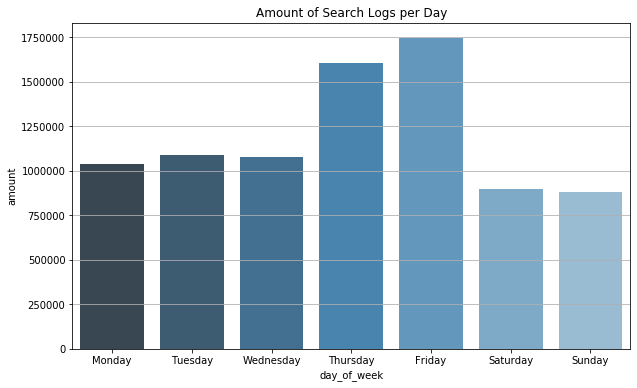

In [63]:
plt.figure(figsize=(10,6))
plt.grid()
sns.barplot("day_of_week", "amount", data=amount_day, 
            palette="Blues_d").set_title("Amount of Search Logs per Day")
plt.savefig("days.png")

In [64]:
conditions = [(df['day_of_week'] == 'Monday') | (df[
    'day_of_week'] == 'Tuesday') | (df[
    'day_of_week'] == 'Wednesday') | (df[
    'day_of_week'] == 'Thursday') | (df[
    'day_of_week'] == 'Friday'), (df[
    'day_of_week'] == 'Saturday') | (df['day_of_week'] == 'Sunday')]
choices = ['Working Day', 'Weekend']
df['DayType'] = np.select(conditions, choices, default='NoGroup')
df.head()

,Date,Time,Application,Variables,search_term,Groups,day_of_week,DayType
0,2019-03-24,00:00:17,Justiz,+(_Type:[1 TO 1]) +GZForZitat:17os9/13x,NaN,Judikatur,Sunday,Weekend
1,2019-03-24,00:00:17,Justiz,+(_Type:[1 TO 1]) +GZForZitat:17os50/14b,NaN,Judikatur,Sunday,Weekend
2,2019-03-24,00:00:17,Justiz,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,NaN,Judikatur,Sunday,Weekend
3,2019-03-24,00:00:17,Justiz,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,NaN,Judikatur,Sunday,Weekend
4,2019-03-24,00:00:17,Justiz,+(_Type:[1 TO 1]) +RechtssatznummerForZitat:rs...,NaN,Judikatur,Sunday,Weekend


In [65]:
amount_dtype = pd.DataFrame()
amount_dtype['amount'] = df.groupby(df['DayType']).size()
amount_dtype['DayType'] = df.groupby(df['DayType']).size().index
amount_dtype

,amount,DayType
DayType,,
Weekend,1780422,Weekend
Working Day,6560522,Working Day


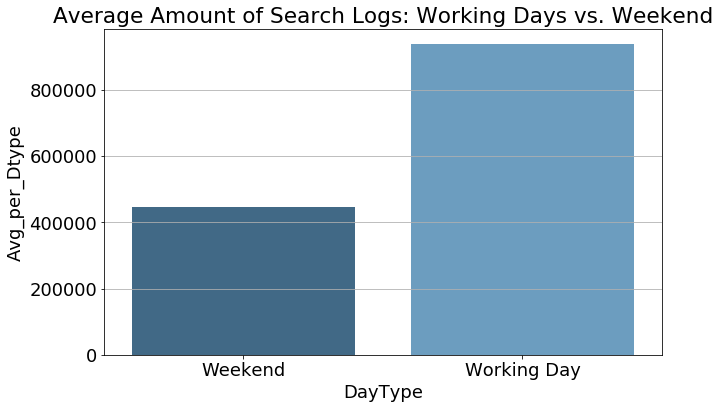

In [66]:
#Amount of Working Days: 7
#Amount of Weekend Days: 4

conditions = [(amount_dtype['DayType'] == 'Working Day'), 
              (amount_dtype['DayType'] == 'Weekend')]
choices = [amount_dtype['amount']/7, amount_dtype['amount']/4]
amount_dtype['Avg_per_Dtype'] = np.select(conditions, choices, 
                                          default='NoGroup')
amount_dtype[
    'Avg_per_Dtype'] = amount_dtype.Avg_per_Dtype.astype(float).round()
plt.rcParams.update({'font.size': 18})
plt.figure(figsize=(10,6))
plt.grid()
sns.barplot("DayType", "Avg_per_Dtype", data=amount_dtype, 
            palette="Blues_d").set_title(
            "Average Amount of Search Logs: Working Days vs. Weekend")
plt.savefig("working_vs_weekend.png")

**Time**

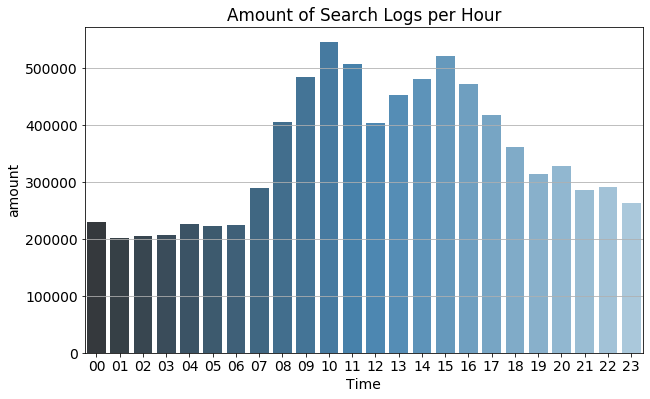

In [67]:
df['Time'] = df['Time'].str.slice(0, -6)
amount_Time = pd.DataFrame()
amount_Time['amount'] = df.groupby(df['Time']).size()
amount_Time['Time'] = df.groupby(df['Time']).size().index
plt.rcParams.update({'font.size': 14})
plt.figure(figsize=(10,6))
plt.grid()
sns.barplot("Time", "amount", data=amount_Time, 
            palette="Blues_d").set_title("Amount of Search Logs per Hour")
plt.savefig("hours.png")

**Preparation for One Hot Encoding**

**Create Filters for the most popular applications for the groups judicature, federal law and state law**

In [68]:
b_filter = bundesrecht['Application'] == 'Bundesnormen'
b = bundesrecht[b_filter]

l_filter = landesrecht['Application'] == 'Landesnormen'
l = landesrecht[l_filter]

j_filter = judikatur['Application'] == 'Justiz'
j = judikatur[j_filter]

**Federal Norms Variables**

In [69]:
#Artikelnummer
artikelnummer = b['Variables'].str.partition('Artikelnummer:[', True)
artikelnummer.columns = ['Before', 'Searched', 'After']
artikelnummer = artikelnummer['After'].str.partition(']', True)
artikelnummer.columns = ['Before', 'Searched', 'After']
artikelnummer[['From','To']] = artikelnummer.Before.str.split(
    " TO ",expand=True,)
artikelnummer = artikelnummer[['From','To']]

#Artikelbuchstabe
b['Variables'] = b['Variables'].str.replace(re.escape(
    'Artikelbuchstabe:['), 'Artikelbuchstabe:')
b['Variables'] = b['Variables'].str.replace(re.escape(
    ' TO *] +(Artikelbuchstabe:* TO '), '-')
artikelbuchstabe = b['Variables'].str.partition('Artikelbuchstabe:', True)
artikelbuchstabe.columns = ['Before', 'Searched', 'After']
artikelbuchstabe = artikelbuchstabe['After'].str.partition('))', True)
artikelbuchstabe.columns = ['Before', 'Searched', 'After']
artikelbuchstabe['Before'] = artikelbuchstabe[
    'Before'].str.replace(re.escape('<<null>>'), '')
artikelbuchstabe['Before'] = artikelbuchstabe[
    'Before'].str.replace(re.escape(']'), '')

#Paragraphnummer
paragraphnummer = b['Variables'].str.partition('Paragraphnummer:[', True)
paragraphnummer.columns = ['Before', 'Searched', 'After']
paragraphnummer = paragraphnummer['After'].str.partition(']', True)
paragraphnummer.columns = ['Before', 'Searched', 'After']
paragraphnummer[['From','To']] = paragraphnummer.Before.str.split(
    " TO ",expand=True,)
paragraphnummer = paragraphnummer[['From','To']]

#Paragraphbuchstabe
b['Variables'] = b['Variables'].str.replace(re.escape(
    'Paragraphbuchstabe:['), 'Paragraphbuchstabe:')
b['Variables'] = b['Variables'].str.replace(re.escape(
    ' TO *] +(Paragraphbuchstabe:* TO '), '-')
paragraphbuchstabe = b['Variables'].str.partition(
    'Paragraphbuchstabe:', True)
paragraphbuchstabe.columns = ['Before', 'Searched', 'After']
paragraphbuchstabe = paragraphbuchstabe['After'].str.partition('))', True)
paragraphbuchstabe.columns = ['Before', 'Searched', 'After']
paragraphbuchstabe['Before'] = paragraphbuchstabe[
    'Before'].str.replace(re.escape('<<null>>'), '')
paragraphbuchstabe['Before'] = paragraphbuchstabe[
    'Before'].str.replace(re.escape(']'), '')

#Titel
titel = b['Variables'].str.partition('+Titel:', True)
titel.columns = ['Before', 'Searched', 'After']
titel['After'] = titel['After'].str.replace(re.escape('+Titel:'), '_')
titel['After'] = titel['After'].str.replace(re.escape(' _'), '_')
titel['After'] = titel['After'].str.replace(re.escape('+'), '&&&')
titel['After'] = titel['After'].str.replace(re.escape(')'), '&&&')
titel['After'] = titel['After'].str.replace(re.escape('_'), ' ')
titel = titel['After'].str.partition('&&&', True)
titel.columns = ['Before', 'Searched', 'After']

#Inkrafttretedatum
inkrafttretedatum = b['Variables'].str.partition(
    'Inkrafttretedatum_date:[', True)
inkrafttretedatum.columns = ['Before', 'Searched', 'After']
inkrafttretedatum = inkrafttretedatum['After'].str.partition(']', True)
inkrafttretedatum.columns = ['Before', 'Searched', 'After']
inkrafttretedatum[['From','To']] = inkrafttretedatum.Before.str.split(
    " TO ",expand=True,)
inkrafttretedatum = inkrafttretedatum[['From','To']]

#Gesetzesnummer
gesetzesnummer = b['Variables'].str.partition('Gesetzesnummer:', True)
gesetzesnummer.columns = ['Before', 'Searched', 'After']
gesetzesnummer = gesetzesnummer.After.str.split(' ').str[0].to_frame()

#StammnormPublikationsorgan
stammnormPublikationsorgan = b['Variables'].str.partition(
    'StammnormPublikationsorgan:', True)
stammnormPublikationsorgan.columns = ['Before', 'Searched', 'After']
stammnormPublikationsorgan = stammnormPublikationsorgan[
    'After'].str.partition(' +', True)
stammnormPublikationsorgan.columns = ['Before', 'Searched', 'After']
stammnormPublikationsorgan = stammnormPublikationsorgan['Before']

#StammnormBgblnummer
stammnormBgblnummer = b['Variables'].str.partition('StammnormBgblnummer:', True)
stammnormBgblnummer.columns = ['Before', 'Searched', 'After']
stammnormBgblnummer['After'] = stammnormBgblnummer[
    'After'].str.replace(re.escape(')'), '')
stammnormBgblnummer = stammnormBgblnummer.After.str.split(
    ' ').str[0].to_frame()

#NovellenBgblnummer
novellenBgblnummer = b['Variables'].str.partition(
    'NovellenBgblnummer:', True)
novellenBgblnummer.columns = ['Before', 'Searched', 'After']
novellenBgblnummer['After'] = novellenBgblnummer[
    'After'].str.replace(re.escape(')'), '')
novellenBgblnummer = novellenBgblnummer.After.str.split(
    ' ').str[0].to_frame()

ausserkrafttretedatum = b['Variables'].str.partition(
    'Ausserkrafttretedatum_date:[', True)
ausserkrafttretedatum.columns = ['Before', 'Searched', 'After']
ausserkrafttretedatum = ausserkrafttretedatum['After'].str.partition(
    ']', True)
ausserkrafttretedatum.columns = ['Before', 'Searched', 'After']
ausserkrafttretedatum[[
    'From','To']] = ausserkrafttretedatum.Before.str.split(
    " TO ",expand=True,)
ausserkrafttretedatum = ausserkrafttretedatum[['From','To']]

In [70]:
variablen = pd.DataFrame()
variablen['Artikelnummer_From'] = artikelnummer['From']
variablen['Artikelnummer_To'] = artikelnummer['To']
variablen['Artikelbuchstabe'] = artikelbuchstabe['Before']
variablen['Paragraphnummer_From'] = paragraphnummer['From']
variablen['Paragraphnummer_To'] = paragraphnummer['To']
variablen['Paragraphbuchstabe'] = paragraphbuchstabe['Before']
variablen['Titel'] = titel['Before']
variablen['Gesetzesnummer'] = gesetzesnummer
variablen['StammnormPublikationsorgan'] = stammnormPublikationsorgan
variablen['StammnormBgblnummer'] = stammnormBgblnummer
variablen['Inkrafttretedatum_From'] = inkrafttretedatum['From']
variablen['Inkrafttretedatum_To'] = inkrafttretedatum['To']
variablen['Ausserkrafttretedatum_From'] = ausserkrafttretedatum['From']
variablen['Ausserkrafttretedatum_To'] = ausserkrafttretedatum['From']
variablen['NovellenBgblnummer'] = novellenBgblnummer
variablen['Search_Term'] = b['search_term']
variablen["Artikelnummer_From"] = variablen[
    "Artikelnummer_From"].str.lstrip('0')
variablen["Paragraphnummer_From"] = variablen[
    "Paragraphnummer_From"].str.lstrip('0')
variablen["Ausserkrafttretedatum_From"] = variablen[
    "Ausserkrafttretedatum_From"].str.lstrip('0')
variablen["Inkrafttretedatum_From"] = variablen[
    "Inkrafttretedatum_From"].str.lstrip('0')
variablen.fillna(value=pd.np.nan, inplace=True)
variablen.replace('', np.nan, inplace=True)
variablen.head(10)

,Artikelnummer_From,Artikelnummer_To,Artikelbuchstabe,Paragraphnummer_From,Paragraphnummer_To,Paragraphbuchstabe,Titel,Gesetzesnummer,StammnormPublikationsorgan,StammnormBgblnummer,Inkrafttretedatum_From,Inkrafttretedatum_To,Ausserkrafttretedatum_From,Ausserkrafttretedatum_To,NovellenBgblnummer,Search_Term
27,NaN,NaN,NaN,209,209,a,bao,NaN,NaN,194/1961,NaN,635242175999999999,635241312000000000,635241312000000000,194/1961,NaN
47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,bgbl. i nr.,33/2013,NaN,NaN,NaN,NaN,NaN,NaN
49,NaN,NaN,NaN,21,21,NaN,abgb,NaN,NaN,NaN,NaN,636890687999999999,636889824000000000,636889824000000000,NaN,NaN
54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10011384,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
115,NaN,NaN,NaN,NaN,0,NaN,NaN,10008163,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
116,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10008163,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
117,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10011336,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
128,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,bgbl. nr.,199/1961,NaN,NaN,NaN,NaN,NaN,NaN
158,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10011138,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
208,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10012577,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


**State Norms Variables**

In [71]:
#Bundesland
bundesland = l['Variables'].str.partition('Bundesland:[', True)
bundesland.columns = ['Before', 'Searched', 'After']
bundesland = bundesland['After'].str.partition(']', True)
bundesland.columns = ['Before', 'Searched', 'After']
bundesland[['Bundesland','To']] = bundesland.Before.str.split(
    " TO ",expand=True,)
bundesland['Bundesland'] = bundesland['Bundesland'].str.replace(re.escape(
    '1'), 'Burgenland')
bundesland['Bundesland'] = bundesland['Bundesland'].str.replace(re.escape(
    '2'), 'Kärnten')
bundesland['Bundesland'] = bundesland['Bundesland'].str.replace(re.escape(
    '3'), 'Niederösterreich')
bundesland['Bundesland'] = bundesland['Bundesland'].str.replace(re.escape(
    '4'), 'Oberösterreich')
bundesland['Bundesland'] = bundesland['Bundesland'].str.replace(re.escape(
    '5'), 'Salzburg')
bundesland['Bundesland'] = bundesland['Bundesland'].str.replace(re.escape(
    '6'), 'Steiermark')
bundesland['Bundesland'] = bundesland['Bundesland'].str.replace(re.escape(
    '7'), 'Tirol')
bundesland['Bundesland'] = bundesland['Bundesland'].str.replace(re.escape(
    '8'), 'Vorarlberg')
bundesland['Bundesland'] = bundesland['Bundesland'].str.replace(re.escape(
    '9'), 'Wien')
bundesland = bundesland['Bundesland']

#Diskriminator
diskriminator = l['Variables'].str.partition('Diskriminator:', True)
diskriminator.columns = ['Before', 'Searched', 'After']
diskriminator = diskriminator['After'].str.partition(' ', True)
diskriminator.columns = ['Before', 'Searched', 'After']
diskriminator = diskriminator['Before']

#Landesnormen_Applikation:[_TO_]
landesnormen_Applikation = l['Variables'].str.partition(
    'LandesnormenApplikation:[', True)
landesnormen_Applikation.columns = ['Before', 'Searched', 'After']
landesnormen_Applikation = landesnormen_Applikation['After'].str.partition(
    ']', True)
landesnormen_Applikation
landesnormen_Applikation.columns = ['Before', 'Searched', 'After']
landesnormen_Applikation[[
    'Landesnormen_Applikation',
    'To']] = landesnormen_Applikation.Before.str.split(
    " TO ",expand=True,)
landesnormen_Applikation[
    'Landesnormen_Applikation'] = landesnormen_Applikation[
    'Landesnormen_Applikation'].str.replace(re.escape('1'), 'Burgenland')
landesnormen_Applikation[
    'Landesnormen_Applikation'] = landesnormen_Applikation[
    'Landesnormen_Applikation'].str.replace(re.escape('2'), 'Kärnten')
landesnormen_Applikation[
    'Landesnormen_Applikation'] = landesnormen_Applikation[
    'Landesnormen_Applikation'].str.replace(re.escape('3'), 'Niederösterreich')
landesnormen_Applikation[
    'Landesnormen_Applikation'] = landesnormen_Applikation[
    'Landesnormen_Applikation'].str.replace(re.escape('4'), 'Oberösterreich')
landesnormen_Applikation[
    'Landesnormen_Applikation'] = landesnormen_Applikation[
    'Landesnormen_Applikation'].str.replace(re.escape('5'), 'Salzburg')
landesnormen_Applikation[
    'Landesnormen_Applikation'] = landesnormen_Applikation[
    'Landesnormen_Applikation'].str.replace(re.escape('6'), 'Steiermark')
landesnormen_Applikation[
    'Landesnormen_Applikation'] = landesnormen_Applikation[
    'Landesnormen_Applikation'].str.replace(re.escape('7'), 'Tirol')
landesnormen_Applikation[
    'Landesnormen_Applikation'] = landesnormen_Applikation[
    'Landesnormen_Applikation'].str.replace(re.escape('8'), 'Vorarlberg')
landesnormen_Applikation[
    'Landesnormen_Applikation'] = landesnormen_Applikation[
    'Landesnormen_Applikation'].str.replace(re.escape('9'), 'Wien')
landesnormen_Applikation = landesnormen_Applikation['Landesnormen_Applikation']

#Titel
titel = l['Variables'].str.partition('+Titel:', True)
titel.columns = ['Before', 'Searched', 'After']
titel['After'] = titel['After'].str.replace(re.escape('+Titel:'), '_')
titel['After'] = titel['After'].str.replace(re.escape(' _'), '_')
titel['After'] = titel['After'].str.replace(re.escape('+'), '&&&')
titel['After'] = titel['After'].str.replace(re.escape(')'), '&&&')
titel['After'] = titel['After'].str.replace(re.escape('_'), ' ')
titel = titel['After'].str.partition('&&&', True)
titel.columns = ['Before', 'Searched', 'After']
titel = titel['Before']

#Paragraphnummer
paragraphnummer = l['Variables'].str.partition('Paragraphnummer:[', True)
paragraphnummer.columns = ['Before', 'Searched', 'After']
paragraphnummer = paragraphnummer['After'].str.partition(']', True)
paragraphnummer.columns = ['Before', 'Searched', 'After']
paragraphnummer[['From','To']] = paragraphnummer.Before.str.split(
    " TO ",expand=True,)
paragraphnummer = paragraphnummer[['From','To']]

#Paragraphbuchstabe
l['Variables'] = l['Variables'].str.replace(re.escape('Paragraphbuchstabe:['), 
                                            'Paragraphbuchstabe:')
l['Variables'] = l['Variables'].str.replace(re.escape(
    ' TO *] +(Paragraphbuchstabe:* TO '), '-')
paragraphbuchstabe = b['Variables'].str.partition('Paragraphbuchstabe:', True)
paragraphbuchstabe.columns = ['Before', 'Searched', 'After']
paragraphbuchstabe = paragraphbuchstabe['After'].str.partition('))', True)
paragraphbuchstabe.columns = ['Before', 'Searched', 'After']
paragraphbuchstabe['Before'] = paragraphbuchstabe[
    'Before'].str.replace(re.escape('<<null>>'), '')
paragraphbuchstabe['Before'] = paragraphbuchstabe[
    'Before'].str.replace(re.escape(']'), '')
paragraphbuchstabe = paragraphbuchstabe['Before']

#Inkrafttretedatum
inkrafttretedatum = l['Variables'].str.partition(
    'Inkrafttretedatum_date:[', True)
inkrafttretedatum.columns = ['Before', 'Searched', 'After']
inkrafttretedatum = inkrafttretedatum['After'].str.partition(']', True)
inkrafttretedatum.columns = ['Before', 'Searched', 'After']
inkrafttretedatum[['From','To']] = inkrafttretedatum.Before.str.split(
    " TO ",expand=True,)
inkrafttretedatum = inkrafttretedatum[['From','To']]

#Ausserkrafttretedatum
ausserkrafttretedatum = l['Variables'].str.partition(
    'Ausserkrafttretedatum_date:[', True)
ausserkrafttretedatum.columns = ['Before', 'Searched', 'After']
ausserkrafttretedatum = ausserkrafttretedatum['After'].str.partition(
    ']', True)
ausserkrafttretedatum.columns = ['Before', 'Searched', 'After']
ausserkrafttretedatum[[
    'From','To']] = ausserkrafttretedatum.Before.str.split(
    " TO ",expand=True,)
ausserkrafttretedatum = ausserkrafttretedatum[['From','To']]

#Gesetzesnummer
gesetzesnummer = l['Variables'].str.partition('Gesetzesnummer:', True)
gesetzesnummer.columns = ['Before', 'Searched', 'After']
gesetzesnummer = gesetzesnummer.After.str.split(' ').str[0].to_frame()

#StammnormPublikationsorgan
stammnormPublikationsorgan = l['Variables'].str.partition(
    'StammnormPublikationsorgan:', True)
stammnormPublikationsorgan.columns = ['Before', 'Searched', 'After']
stammnormPublikationsorgan = stammnormPublikationsorgan[
    'After'].str.partition(' +', True)
stammnormPublikationsorgan.columns = ['Before', 'Searched', 'After']
stammnormPublikationsorgan = stammnormPublikationsorgan['Before']

#StammnormBgblnummer
stammnormBgblnummer = l['Variables'].str.partition(
    'StammnormBgblnummer:', True)
stammnormBgblnummer.columns = ['Before', 'Searched', 'After']
stammnormBgblnummer['After'] = stammnormBgblnummer[
    'After'].str.replace(re.escape(')'), '')
stammnormBgblnummer = stammnormBgblnummer.After.str.split(
    ' ').str[0].to_frame()

In [72]:
l_variablen = pd.DataFrame()
l_variablen['Bundesland'] = bundesland
l_variablen['Diskriminator'] = diskriminator
l_variablen['Landesnormen_Applikation'] = landesnormen_Applikation
l_variablen['Paragraphnummer_From'] = paragraphnummer['From']
l_variablen['Paragraphnummer_To'] = paragraphnummer['To']
l_variablen['Paragraphbuchstabe'] = paragraphbuchstabe
l_variablen['Titel'] = titel
l_variablen['Gesetzesnummer'] = gesetzesnummer
l_variablen['StammnormPublikationsorgan'] = stammnormPublikationsorgan
l_variablen['StammnormBgblnummer'] = stammnormBgblnummer
l_variablen['Inkrafttretedatum_From'] = inkrafttretedatum['From']
l_variablen['Inkrafttretedatum_To'] = inkrafttretedatum['To']
l_variablen['Ausserkrafttretedatum_From'] = ausserkrafttretedatum['From']
l_variablen['Ausserkrafttretedatum_To'] = ausserkrafttretedatum['From']
l_variablen['Search_Term'] = l['search_term']
l_variablen["Paragraphnummer_From"] = l_variablen[
    "Paragraphnummer_From"].str.lstrip('0')
l_variablen["Ausserkrafttretedatum_From"] = l_variablen[
    "Ausserkrafttretedatum_From"].str.lstrip('0')
l_variablen["Inkrafttretedatum_From"] = l_variablen[
    "Inkrafttretedatum_From"].str.lstrip('0')
l_variablen.fillna(value=pd.np.nan, inplace=True)
l_variablen.replace('', np.nan, inplace=True)
l_variablen.head(10)

,Bundesland,Diskriminator,Landesnormen_Applikation,Paragraphnummer_From,Paragraphnummer_To,Paragraphbuchstabe,Titel,Gesetzesnummer,StammnormPublikationsorgan,StammnormBgblnummer,Inkrafttretedatum_From,Inkrafttretedatum_To,Ausserkrafttretedatum_From,Ausserkrafttretedatum_To,Search_Term
188,NaN,Steiermark,NaN,NaN,NaN,NaN,NaN,20000070,NaN,NaN,NaN,NaN,NaN,NaN,NaN
307,NaN,Wien,NaN,NaN,NaN,NaN,NaN,20000131,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1025,NaN,Tirol,NaN,NaN,NaN,NaN,NaN,20000474,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1223,NaN,Niederösterreich,NaN,NaN,NaN,NaN,NaN,20001079,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1321,Niederösterreich,NaN,NaN,NaN,0,NaN,NaN,20001079,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1420,NaN,NaN,Niederösterreich,NaN,NaN,NaN,NaN,NaN,lgbl*,69/2015,NaN,NaN,NaN,NaN,NaN
1456,Oberösterreich,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,636890687999999999,636889824000000000,636889824000000000,ugb
1616,Salzburg,NaN,NaN,31,31,NaN,rog,NaN,NaN,NaN,NaN,636890687999999999,636889824000000000,636889824000000000,NaN
1617,NaN,Salzburg,NaN,NaN,NaN,NaN,NaN,20000615,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1677,NaN,Oberösterreich,NaN,NaN,NaN,NaN,NaN,20000726,NaN,NaN,NaN,NaN,NaN,NaN,NaN


**Judiciary Variables**

In [73]:
#Dokumenttyp
dokumenttyp = j['Variables'].str.partition('Documenttyp:[', True)
dokumenttyp.columns = ['Before', 'Searched', 'After']
dokumenttyp = dokumenttyp['After'].str.partition(' ', True)
dokumenttyp.columns = ['Before', 'Searched', 'After']
dokumenttyp = dokumenttyp['Before']

#GZ_canonical
gz_canonical = j['Variables'].str.partition('GZ_canonical:', True)
gz_canonical.columns = ['Before', 'Searched', 'After']
gz_canonical = gz_canonical['After'].str.partition(' ', True)
gz_canonical.columns = ['Before', 'Searched', 'After']
gz_canonical = gz_canonical['Before']

#GZForZitat
gzForZitat = j['Variables'].str.partition('GZForZitat:', True)
gzForZitat.columns = ['Before', 'Searched', 'After']
gzForZitat = gzForZitat.After.str.split(' ').str[0].to_frame()

#RechtssatznummerForZitat
rechtssatznummerForZitat = j['Variables'].str.partition(
    '+RechtssatznummerForZitat:', True)
rechtssatznummerForZitat.columns = ['Before', 'Searched', 'After']
rechtssatznummerForZitat = rechtssatznummerForZitat[
    'After'].str.partition(' ', True)
rechtssatznummerForZitat.columns = ['Before', 'Searched', 'After']
rechtssatznummerForZitat = rechtssatznummerForZitat['Before']


#Rechtssatznummer
rechtssatznummer = j['Variables'].str.partition('+Rechtssatznummer:', True)
rechtssatznummer.columns = ['Before', 'Searched', 'After']
rechtssatznummer = rechtssatznummer['After'].str.partition(' ', True)
rechtssatznummer.columns = ['Before', 'Searched', 'After']
rechtssatznummer = rechtssatznummer['Before']

#Norm
norm = j['Variables'].str.partition('+Norm:', True)
norm.columns = ['Before', 'Searched', 'After']
norm = norm.After.str.split(' ').str[0].to_frame()

#Gericht
gericht = j['Variables'].str.partition('+Gericht:', True)
gericht.columns = ['Before', 'Searched', 'After']
gericht = gericht.After.str.split(' ').str[0].to_frame()

#Fundstelle
fundstelle = j['Variables'].str.partition('+Fundstelle:', True)
fundstelle.columns = ['Before', 'Searched', 'After']
fundstelle['After'] = fundstelle['After'].str.replace(re.escape(
    '+Fundstelle:'), ' ')
fundstelle['After'] = fundstelle['After'].str.replace(re.escape(' +'), '&&&')
fundstelle['After'] = fundstelle['After'].str.replace(re.escape(')'), '&&&')
fundstelle = fundstelle['After'].str.partition('&&&', True)
fundstelle.columns = ['Before', 'Searched', 'After']
fundstelle = fundstelle['Before']

#Datum_date
datum_date = j['Variables'].str.partition('Datum_date:[', True)
datum_date.columns = ['Before', 'Searched', 'After']
datum_date = datum_date['After'].str.partition(']', True)
datum_date.columns = ['Before', 'Searched', 'After']
datum_date[['From','To']] = datum_date.Before.str.split(" TO ",expand=True,)
datum_date = datum_date[['From','To']]

#Veroeffentlichungsdatum_date
veroeffentlichungsdatum_date = j['Variables'].str.partition(
    'Veroeffentlichungsdatum_date:[', True)
veroeffentlichungsdatum_date.columns = ['Before', 'Searched', 'After']
veroeffentlichungsdatum_date = veroeffentlichungsdatum_date[
    'After'].str.partition(']', True)
veroeffentlichungsdatum_date.columns = ['Before', 'Searched', 'After']
veroeffentlichungsdatum_date[[
    'From','To']] = veroeffentlichungsdatum_date.Before.str.split(
    " TO ",expand=True,)
veroeffentlichungsdatum_date = veroeffentlichungsdatum_date[['From','To']]

In [74]:
j_variablen = pd.DataFrame()
j_variablen['Dokumenttyp'] = dokumenttyp
j_variablen['GZ_canonical'] = gz_canonical
j_variablen['RechtssatznummerForZitat'] = rechtssatznummerForZitat
j_variablen['Rechtssatznummer'] = rechtssatznummer
j_variablen['GZForZitat'] = gzForZitat
j_variablen['Datum__From'] = datum_date['From']
j_variablen['Datum__To'] = datum_date['To']
j_variablen[
    'Veroeffentlichungsdatum_From'] = veroeffentlichungsdatum_date['From']
j_variablen[
    'Veroeffentlichungsdatum_To'] = veroeffentlichungsdatum_date['To']
j_variablen['Gericht'] = gericht
j_variablen['Norm'] = norm
j_variablen['Fundstelle'] = fundstelle
j_variablen['Search_Term'] = j['search_term']
j_variablen["Datum__From"] = j_variablen["Datum__From"].str.lstrip('0')
j_variablen["Veroeffentlichungsdatum_From"] = j_variablen[
    "Veroeffentlichungsdatum_From"].str.lstrip('0')
j_variablen.fillna(value=pd.np.nan, inplace=True)
j_variablen.replace('', np.nan, inplace=True)
j_variablen.head(10)

,Dokumenttyp,GZ_canonical,RechtssatznummerForZitat,Rechtssatznummer,GZForZitat,Datum__From,Datum__To,Veroeffentlichungsdatum_From,Veroeffentlichungsdatum_To,Gericht,Norm,Fundstelle,Search_Term
0,NaN,NaN,NaN,NaN,17os9/13x,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,17os50/14b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,rs0096733,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,rs0124172,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,rs0118016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,rs0108614,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,rs0106268,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,rs0118780,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,rs0109797,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,rs0122138,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


**Federal Norms Variables One Hot Encoding**

In [75]:
#Reset Index at 0
variablen = variablen.reset_index(drop=True)

#Used or not used
used = pd.DataFrame()
var = variablen.columns #load column names into a list

for v in var: #loop goes through all column names
    conditions = [
    (variablen[v].isnull()),
    (variablen[v].isnull() == False)]
    choices = ['not_used','used']
    used[v] = np.select(conditions, choices, default='error')

onehot_federal = pd.get_dummies(used)
onehot_federal.head()

,Artikelnummer_From_not_used,Artikelnummer_From_used,Artikelnummer_To_not_used,Artikelnummer_To_used,Artikelbuchstabe_not_used,Artikelbuchstabe_used,Paragraphnummer_From_not_used,Paragraphnummer_From_used,Paragraphnummer_To_not_used,Paragraphnummer_To_used,...,Inkrafttretedatum_To_not_used,Inkrafttretedatum_To_used,Ausserkrafttretedatum_From_not_used,Ausserkrafttretedatum_From_used,Ausserkrafttretedatum_To_not_used,Ausserkrafttretedatum_To_used,NovellenBgblnummer_not_used,NovellenBgblnummer_used,Search_Term_not_used,Search_Term_used
0,1,0,1,0,1,0,0,1,0,1,...,0,1,0,1,0,1,0,1,1,0
1,1,0,1,0,1,0,1,0,1,0,...,1,0,1,0,1,0,1,0,1,0
2,1,0,1,0,1,0,0,1,0,1,...,0,1,0,1,0,1,1,0,1,0
3,1,0,1,0,1,0,1,0,1,0,...,1,0,1,0,1,0,1,0,1,0
4,1,0,1,0,1,0,1,0,0,1,...,1,0,1,0,1,0,1,0,1,0


**State Norms Variables One Hot Encoding**

In [76]:
l_variablen = l_variablen.reset_index(drop=True)
#Reset Index at 0
#l_variablen contains the State Law

l_used = pd.DataFrame()
l_var = l_variablen.columns #load column names into a list

for v in l_var: #loop goes through all column names
    conditions = [
    (l_variablen[v].isnull()),
    (l_variablen[v].isnull() == False)]
    choices = ['not_used','used']
    l_used[v] = np.select(conditions, choices, default='error')

onehot_state = pd.get_dummies(l_used)
onehot_state.head()

,Bundesland_not_used,Bundesland_used,Diskriminator_not_used,Diskriminator_used,Landesnormen_Applikation_not_used,Landesnormen_Applikation_used,Paragraphnummer_From_not_used,Paragraphnummer_From_used,Paragraphnummer_To_not_used,Paragraphnummer_To_used,...,Inkrafttretedatum_From_not_used,Inkrafttretedatum_From_used,Inkrafttretedatum_To_not_used,Inkrafttretedatum_To_used,Ausserkrafttretedatum_From_not_used,Ausserkrafttretedatum_From_used,Ausserkrafttretedatum_To_not_used,Ausserkrafttretedatum_To_used,Search_Term_not_used,Search_Term_used
0,1,0,0,1,1,0,1,0,1,0,...,1,0,1,0,1,0,1,0,1,0
1,1,0,0,1,1,0,1,0,1,0,...,1,0,1,0,1,0,1,0,1,0
2,1,0,0,1,1,0,1,0,1,0,...,1,0,1,0,1,0,1,0,1,0
3,1,0,0,1,1,0,1,0,1,0,...,1,0,1,0,1,0,1,0,1,0
4,0,1,1,0,1,0,1,0,0,1,...,1,0,1,0,1,0,1,0,1,0


**Judiciary Variables One Hot Encoding**

In [77]:
#Reset Index at 0
j_variablen = j_variablen.reset_index(drop=True)

#Used or not used

j_used = pd.DataFrame()
j_var = j_variablen.columns #load column names into a list

for v in j_var: #loop goes through all column names
    conditions = [
    (j_variablen[v].isnull()),
    (j_variablen[v].isnull() == False)]
    choices = ['not_used','used']
    j_used[v] = np.select(conditions, choices, default='error')

onehot_judicature = pd.get_dummies(j_used)
onehot_judicature.head()

,Dokumenttyp_not_used,Dokumenttyp_used,GZ_canonical_not_used,GZ_canonical_used,RechtssatznummerForZitat_not_used,RechtssatznummerForZitat_used,Rechtssatznummer_not_used,Rechtssatznummer_used,GZForZitat_not_used,GZForZitat_used,...,Veroeffentlichungsdatum_To_not_used,Veroeffentlichungsdatum_To_used,Gericht_not_used,Gericht_used,Norm_not_used,Norm_used,Fundstelle_not_used,Fundstelle_used,Search_Term_not_used,Search_Term_used
0,1,0,1,0,1,0,1,0,0,1,...,1,0,1,0,1,0,1,0,1,0
1,1,0,1,0,1,0,1,0,0,1,...,1,0,1,0,1,0,1,0,1,0
2,1,0,1,0,0,1,1,0,1,0,...,1,0,1,0,1,0,1,0,1,0
3,1,0,1,0,0,1,1,0,1,0,...,1,0,1,0,1,0,1,0,1,0
4,1,0,1,0,0,1,1,0,1,0,...,1,0,1,0,1,0,1,0,1,0


In [78]:
onehot_federal.to_csv('onehot_federal.csv')
onehot_state.to_csv('onehot_state.csv')
onehot_judicature.to_csv('onehot_judicature.csv')

**State Law: Federal States Comparison**

In [79]:
l_variablen['B'] = l_variablen[l_variablen.columns[0:3]].apply(
    lambda x: ','.join(x.dropna().astype(str)),
    axis=1)
l_variablen.replace('', np.nan, inplace=True)
l_variablen.head()

,Bundesland,Diskriminator,Landesnormen_Applikation,Paragraphnummer_From,Paragraphnummer_To,Paragraphbuchstabe,Titel,Gesetzesnummer,StammnormPublikationsorgan,StammnormBgblnummer,Inkrafttretedatum_From,Inkrafttretedatum_To,Ausserkrafttretedatum_From,Ausserkrafttretedatum_To,Search_Term,B
0,NaN,Steiermark,NaN,NaN,NaN,NaN,NaN,20000070,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Steiermark
1,NaN,Wien,NaN,NaN,NaN,NaN,NaN,20000131,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Wien
2,NaN,Tirol,NaN,NaN,NaN,NaN,NaN,20000474,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Tirol
3,NaN,Niederösterreich,NaN,NaN,NaN,NaN,NaN,20001079,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Niederösterreich
4,Niederösterreich,NaN,NaN,NaN,0,NaN,NaN,20001079,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Niederösterreich


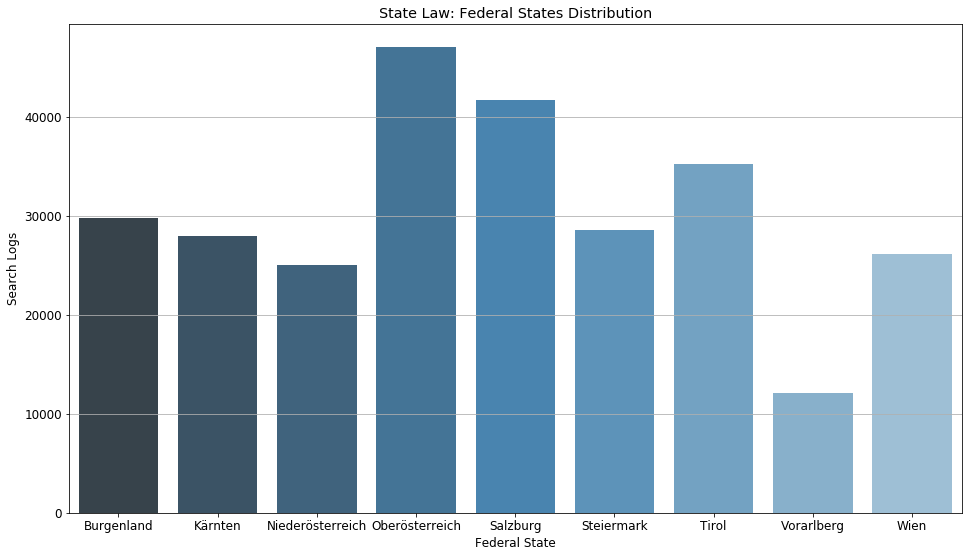

In [80]:
l_variablen['B'] = l_variablen['B'].str.replace(re.escape('0'), '')
fstates = pd.DataFrame()
fstates['Search Logs'] = l_variablen.groupby(l_variablen['B']).size()
fstates['Federal State'] = l_variablen.groupby(l_variablen[
    'B']).size().index
plt.figure(figsize=(16,9))
plt.rcParams.update({'font.size': 12})
plt.grid()
sns.barplot("Federal State", "Search Logs", data=fstates, 
            palette="Blues_d").set_title(
            "State Law: Federal States Distribution")
plt.savefig("blaender.png")

**Data Map**

In [81]:
#Data for the map
fstates

#Tool
#https://www.datamaps.eu/tool/

,Search Logs,Federal State
B,,
Burgenland,29774,Burgenland
Kärnten,28001,Kärnten
Niederösterreich,24994,Niederösterreich
Oberösterreich,47051,Oberösterreich
Salzburg,41679,Salzburg
Steiermark,28603,Steiermark
Tirol,35179,Tirol
Vorarlberg,12060,Vorarlberg
Wien,26098,Wien


<img src="federalstates.png">

**Judiciary**

In [82]:
j_variablen.count()

Dokumenttyp                       77955
GZ_canonical                      31690
RechtssatznummerForZitat        2034564
Rechtssatznummer                  14859
GZForZitat                      2359156
Datum__From                        2844
Datum__To                        120620
Veroeffentlichungsdatum_From       3805
Veroeffentlichungsdatum_To         3805
Gericht                            5539
Norm                              22908
Fundstelle                           34
Search_Term                       52573
dtype: int64

**Top 10 CoreNumberForQuote (GZForZitat)**

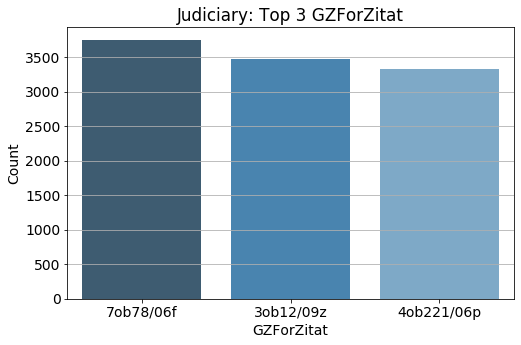

In [83]:
gz_stat = pd.DataFrame()
gz_stat['Count'] = j_variablen.GZForZitat.value_counts()
gz_stat['GZForZitat'] = j_variablen.GZForZitat.value_counts().index
top_gz = gz_stat.head(3)
plt.figure(figsize=(8,5))
plt.rcParams.update({'font.size': 14})
plt.grid()
sns.barplot("GZForZitat", "Count", data=top_gz, palette=
            "Blues_d").set_title("Judiciary: Top 3 GZForZitat")
plt.savefig("top3gz.png")

**Top 10 LegalRuleNumberForQuote (RechtssatznummerForZitat)**

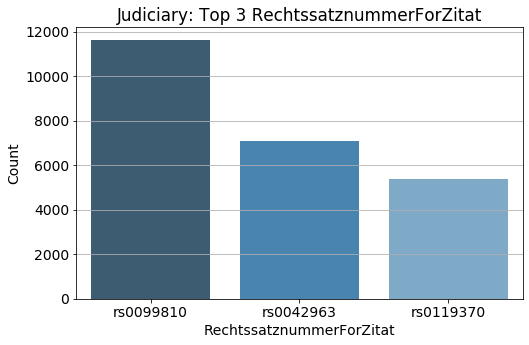

In [84]:
rs_stat = pd.DataFrame()
rs_stat['Count'] = j_variablen.RechtssatznummerForZitat.value_counts()
rs_stat[
    'RechtssatznummerForZitat'] = j_variablen[
    'RechtssatznummerForZitat'].value_counts().index
top_rs = rs_stat.head(3)
plt.figure(figsize=(8,5))
plt.rcParams.update({'font.size': 14})
plt.grid()
sns.barplot("RechtssatznummerForZitat", "Count", 
            data=top_rs, palette="Blues_d").set_title(
    "Judiciary: Top 3 RechtssatznummerForZitat")
plt.savefig("top3rs.png")

**Amount of unique CoreNumberForQuote (GZForZitat)**

In [85]:
j_variablen.GZForZitat.nunique()
#Return Series with number of distinct observations.

83471

**Amount of used variables Judiciary**

In [86]:
j_variablen.shape

(4514781, 13)

**Federal Norms**

In [87]:
variablen.count()

Artikelnummer_From              3450
Artikelnummer_To                3450
Artikelbuchstabe                 179
Paragraphnummer_From          156979
Paragraphnummer_To            553118
Paragraphbuchstabe             22091
Titel                         245668
Gesetzesnummer                959795
StammnormPublikationsorgan     28786
StammnormBgblnummer            47048
Inkrafttretedatum_From           337
Inkrafttretedatum_To          297426
Ausserkrafttretedatum_From    297059
Ausserkrafttretedatum_To      297077
NovellenBgblnummer             22871
Search_Term                    48689
dtype: int64

**Top 3 Legislative Numbers**

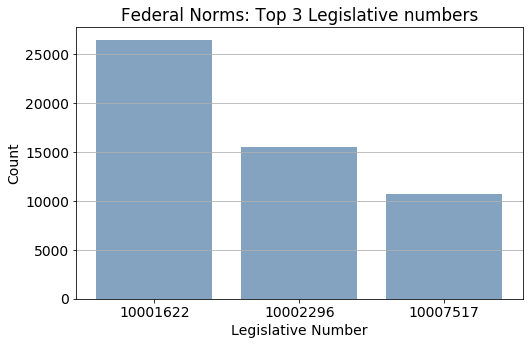

In [88]:
ges_nr = pd.DataFrame()
ges_nr['Count'] = variablen.Gesetzesnummer.value_counts()
ges_nr['Gesetzesnummer'] = variablen.Gesetzesnummer.value_counts().index
top_gnr = ges_nr.head(3)
list1 = top_gnr['Count'].tolist()
list2 = top_gnr['Gesetzesnummer'].tolist()


plt.figure(figsize=(8,5))
plt.rcParams.update({'font.size': 14})
plt.xlabel("Legislative Number")
plt.ylabel("Count")
plt.title("Federal Norms: Top 3 Legislative numbers")
plt.bar(list2, list1, color=(0.2, 0.4, 0.6, 0.6))
plt.grid(axis='y')
plt.savefig("top3gnrf.png")
plt.show()

**Top 3 Titles**

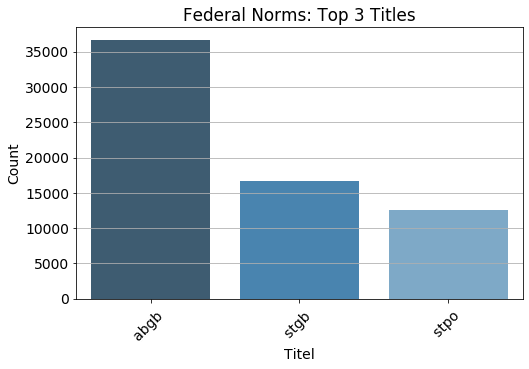

In [89]:
titel = pd.DataFrame()
titel['Count'] = variablen.Titel.value_counts()
titel['Titel'] = variablen.Titel.value_counts().index
top_titel = titel.head(3)
plt.figure(figsize=(8,5))
plt.rcParams.update({'font.size': 14})
plt.grid()
plt.xticks(rotation=45)
sns.barplot("Titel", "Count", data=top_titel, palette="Blues_d").set_title(
    "Federal Norms: Top 3 Titles")
plt.savefig("top3titelf.png", bbox_inches="tight")

**State Norms**

In [90]:
l_variablen.count()

Bundesland                    115928
Diskriminator                 152034
Landesnormen_Applikation        5477
Paragraphnummer_From            4322
Paragraphnummer_To             85748
Paragraphbuchstabe                 0
Titel                          18184
Gesetzesnummer                230285
StammnormPublikationsorgan      5508
StammnormBgblnummer             7432
Inkrafttretedatum_From            84
Inkrafttretedatum_To           37127
Ausserkrafttretedatum_From     37043
Ausserkrafttretedatum_To       37044
Search_Term                    17182
B                             273439
dtype: int64

**Top 3 Legislative Numbers**

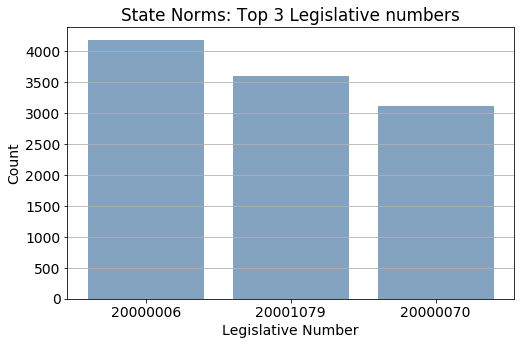

In [91]:
ges_nr = pd.DataFrame()
ges_nr['Count'] = l_variablen.Gesetzesnummer.value_counts()
ges_nr['Gesetzesnummer'] = l_variablen.Gesetzesnummer.value_counts().index
top_gnr = ges_nr.head(3)
list1 = top_gnr['Count'].tolist()
list2 = top_gnr['Gesetzesnummer'].tolist()


plt.figure(figsize=(8,5))
plt.rcParams.update({'font.size': 14})
plt.xlabel("Legislative Number")
plt.ylabel("Count")
plt.title("State Norms: Top 3 Legislative numbers")
plt.bar(list2, list1, color=(0.2, 0.4, 0.6, 0.6))
plt.grid(axis='y')
plt.savefig("top3gnrs.png")
plt.show()

**Top 3 Titles**

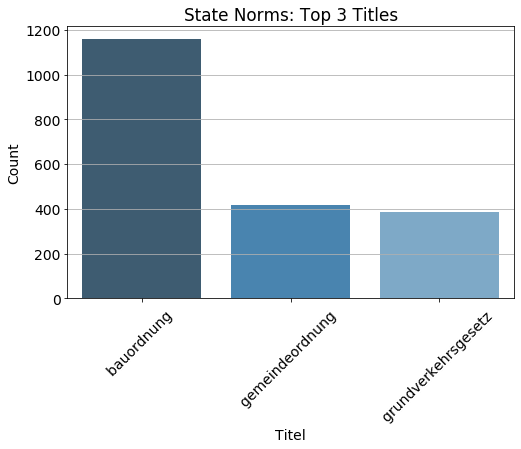

In [92]:
titel = pd.DataFrame()
titel['Count'] = l_variablen.Titel.value_counts()
titel['Titel'] = l_variablen.Titel.value_counts().index
top_titel = titel.head(3)
plt.figure(figsize=(8,5))
plt.rcParams.update({'font.size': 14})
plt.grid()
bar_plot = sns.barplot("Titel", "Count", data=top_titel, 
                       palette="Blues_d").set_title(
    "State Norms: Top 3 Titles")
plt.xticks(rotation=45)
plt.savefig("top3titelstate.png", bbox_inches="tight")
plt.show()